## Импорт библиотек, основные функции

In [9]:
import torch
from networkx.algorithms.bridges import bridges
from torchvision import transforms
from PIL import Image
from datasets import CustomImageDataset, AugmentationPipeline
from visual_utils import show_images, show_single_augmentation, show_multiple_augmentations, show_pipeline_aug, show_time, show_memory, plot_training_history
from extra_augs import (AddGaussianNoise, RandomErasingCustom, CutOut,
                       Solarize, Posterize, AutoContrast, ElasticTransform, RandomBlur, RandomContrast, RandomBrightness)
import os
import numpy as np
import matplotlib.pyplot as plt
import psutil
import time
from model_utils import train_model

In [10]:
noise_aug = transforms.Compose([
    transforms.ToTensor(),
    AddGaussianNoise(0., 0.2)
])
erase_aug = transforms.Compose([
    transforms.ToTensor(),
    RandomErasingCustom(p=1.0)
])
cutout_aug = transforms.Compose([
    transforms.ToTensor(),
    CutOut(p=1.0, size=(32, 32))
])
solarize_aug = transforms.Compose([
    transforms.ToTensor(),
    Solarize(threshold=128)
])
posterize_aug = transforms.Compose([
    transforms.ToTensor(),
    Posterize(bits=4)
])
autocontrast_aug = transforms.Compose([
    transforms.ToTensor(),
    AutoContrast(p=1.0)
])
elastic_aug = transforms.Compose([
    transforms.ToTensor(),
    ElasticTransform(p=1.0, alpha=1, sigma=50)
])
all_aug = transforms.Compose([
    transforms.ToTensor(),
    AddGaussianNoise(0., 0.2),
    RandomErasingCustom(p=1.0),
    CutOut(p=1.0, size=(32, 32)),
    Solarize(threshold=128),
    Posterize(bits=4),
    AutoContrast(p=1.0),
    ElasticTransform(p=1.0, alpha=1, sigma=50)
])
get_tensor = transforms.Compose([
    transforms.ToTensor(),
])
def get_augs_list(img):
    augs_images = []
    augs_images.append(noise_aug(img))
    augs_images.append(erase_aug(img))
    augs_images.append(cutout_aug(img))
    augs_images.append(solarize_aug(img))
    augs_images.append(posterize_aug(img))
    augs_images.append(autocontrast_aug(img))
    augs_images.append(elastic_aug(img))
    augs_images.append(all_aug(img))
    return augs_images

light_pipeline = AugmentationPipeline()
light_pipeline.add_augmentation("random_flip", transforms.RandomHorizontalFlip(p=0.5))
light_pipeline.add_augmentation("random_crop", transforms.RandomCrop(200, padding=20, padding_mode='reflect'))
light_pipeline.add_augmentation("random_brightness", RandomBrightness(p=0.3, brightness_range=(0.8, 1.2)))

medium_pipeline = AugmentationPipeline()
medium_pipeline.add_augmentation("random_flip", transforms.RandomHorizontalFlip(p=0.5))
medium_pipeline.add_augmentation("random_resized_crop", transforms.RandomResizedCrop(224, scale=(0.7, 1.0), ratio=(0.75, 1.33)))
medium_pipeline.add_augmentation("color_jitter", transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1))
medium_pipeline.add_augmentation("random_rotation", transforms.RandomRotation(degrees=20))

heavy_pipeline = AugmentationPipeline()
heavy_pipeline.add_augmentation("random_flip", transforms.RandomHorizontalFlip(p=0.5))
heavy_pipeline.add_augmentation("random_resized_crop", transforms.RandomResizedCrop(224, scale=(0.5, 1.0), ratio=(0.5, 2.0)))
heavy_pipeline.add_augmentation("color_jitter", transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.2))
heavy_pipeline.add_augmentation("random_rotation", transforms.RandomRotation(degrees=45))
heavy_pipeline.add_augmentation("random_affine", transforms.RandomAffine(degrees=15, translate=(0.2, 0.2), scale=(0.8, 1.2), shear=10))
heavy_pipeline.add_augmentation("random_contrast", RandomContrast(p=0.7, contrast_range=(0.4, 1.8)))

## 1 - Стандартные аугментации torchvision

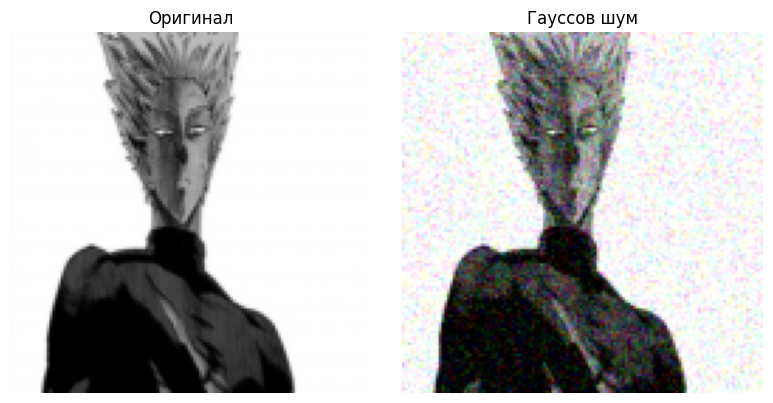

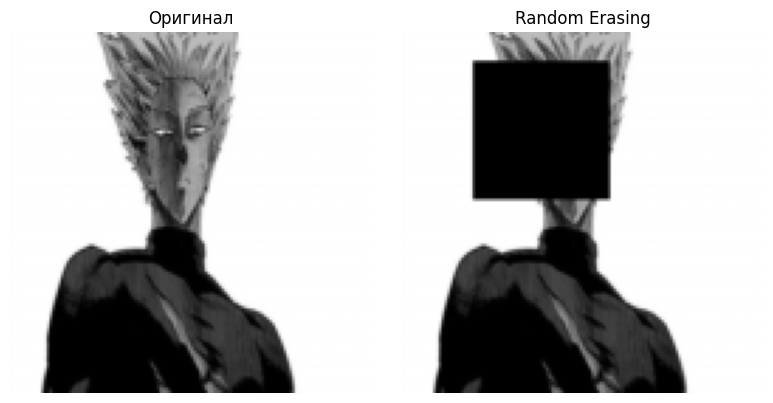

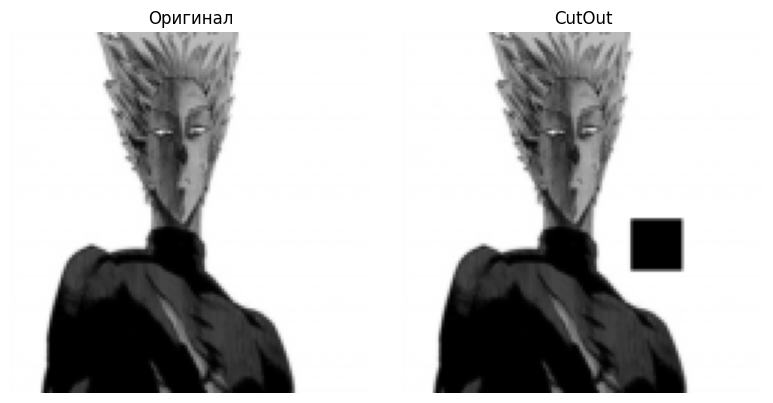

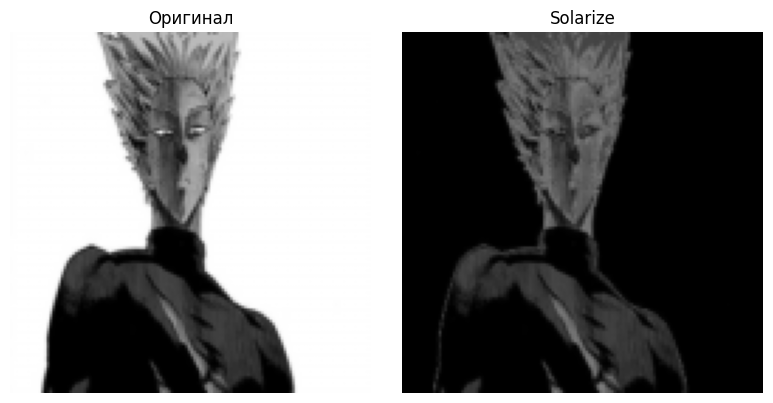

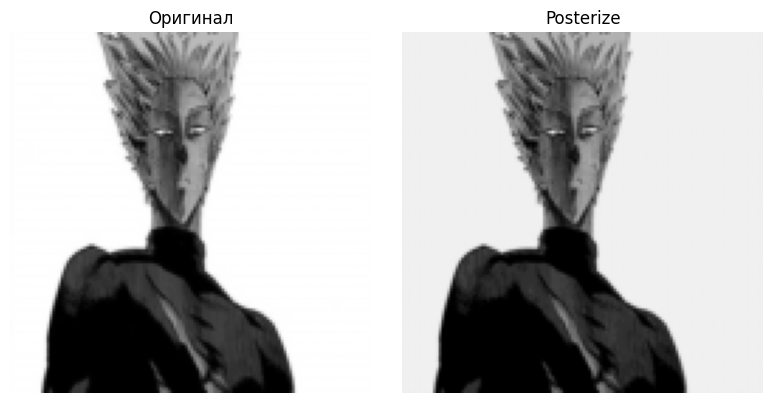

...

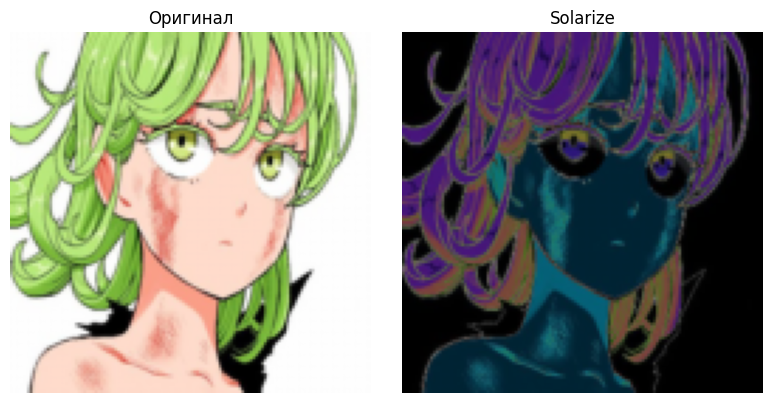

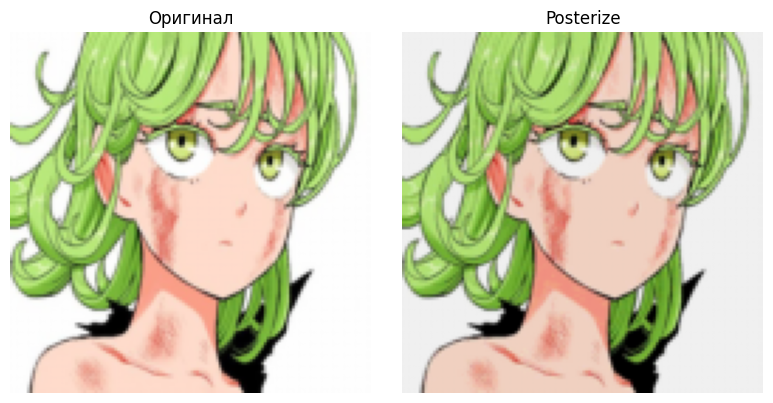

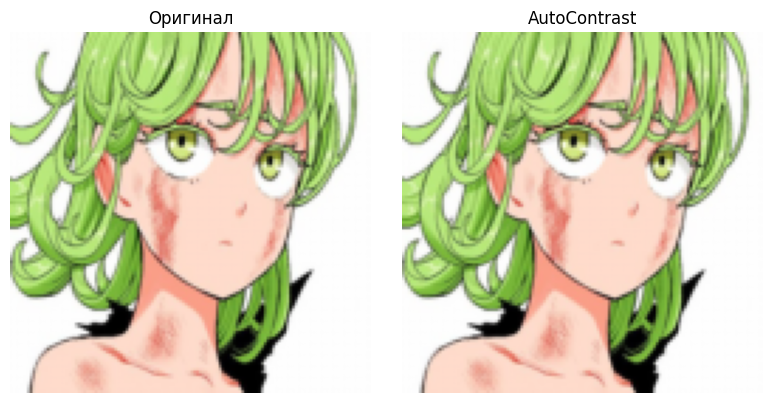

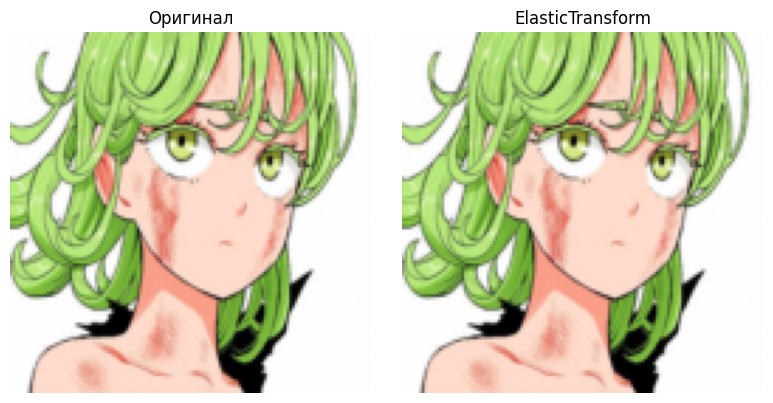

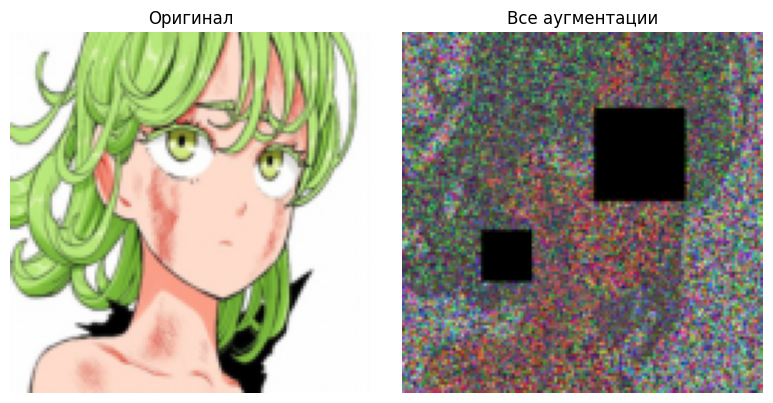

In [11]:
root = 'data/train'
dataset = CustomImageDataset(root, transform=None, target_size=(224, 224))
class_names = dataset.get_class_names()

originals, labels = [], []
for i in range(len(dataset)):
    orig_img, label = dataset[i]
    if label not in labels and len(labels) < 5:
        originals.append(orig_img)
        labels.append(label)

for i in range(len(originals)):
    orig_img = get_tensor(originals[i])
    augs_images = get_augs_list(originals[i])
    augs_names = ["Гауссов шум", "Random Erasing", "CutOut", "Solarize", "Posterize", "AutoContrast", "ElasticTransform", "Все аугментации"]
    for i in range(len(augs_images)):
        show_single_augmentation(orig_img, augs_images[i], augs_names[i])


## 2 - Кастомные аугментации

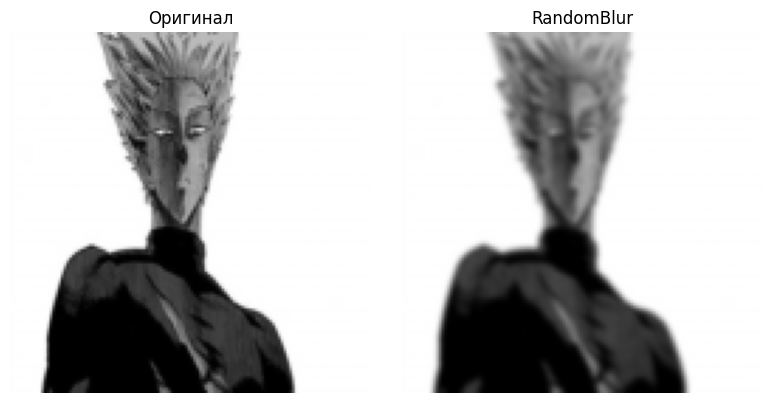

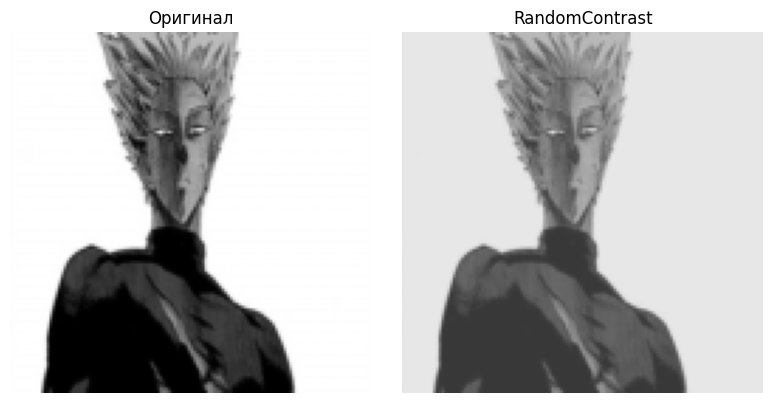

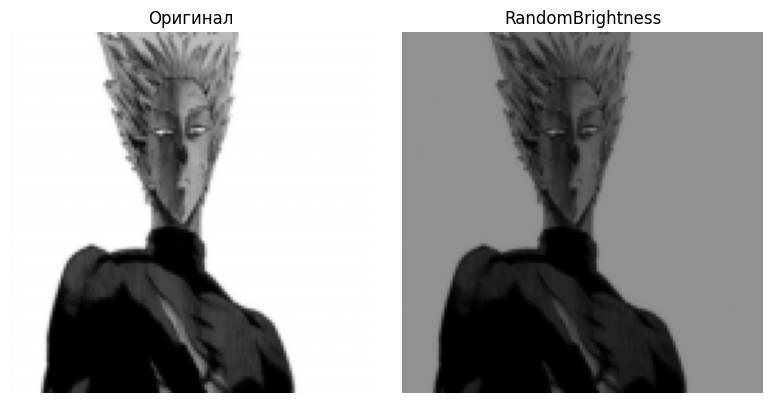

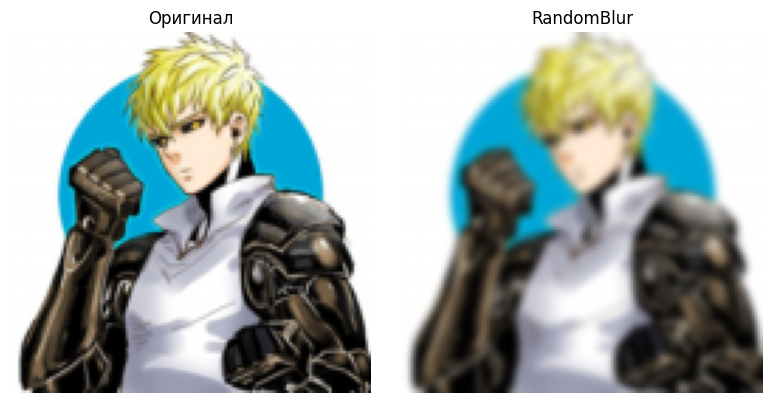

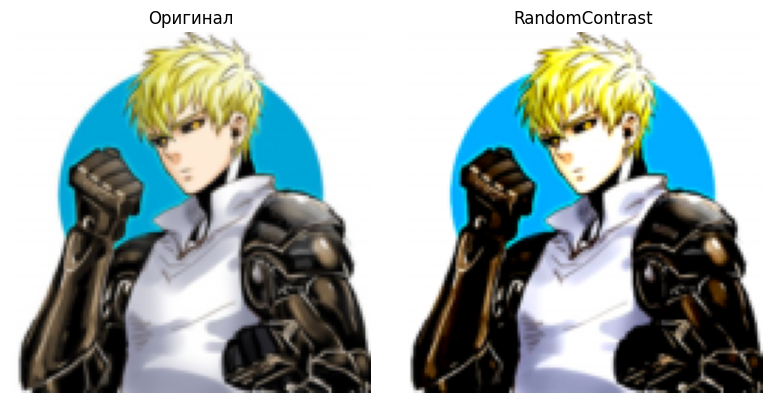

...

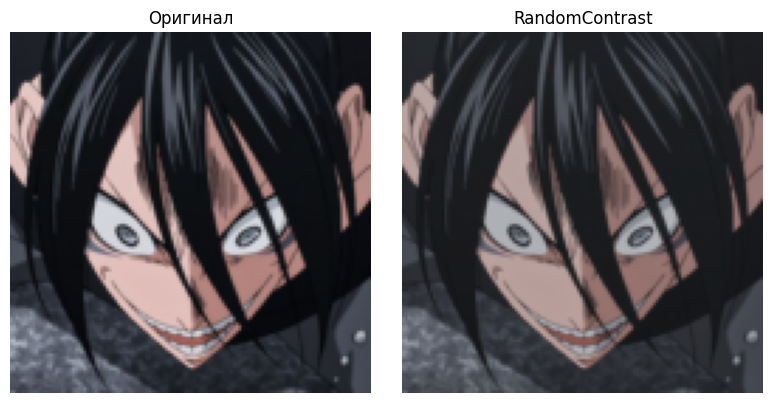

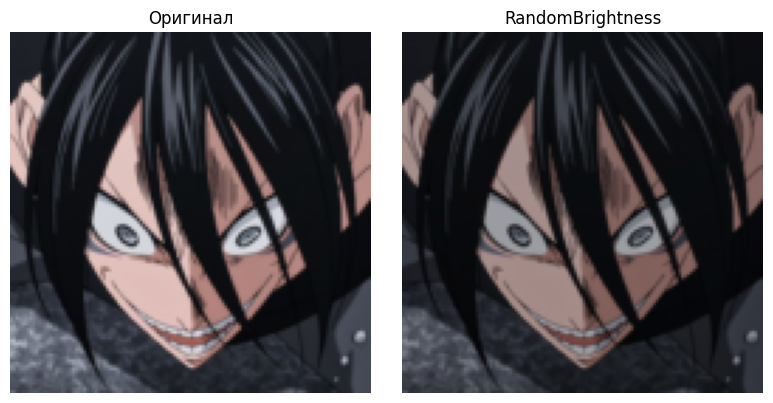

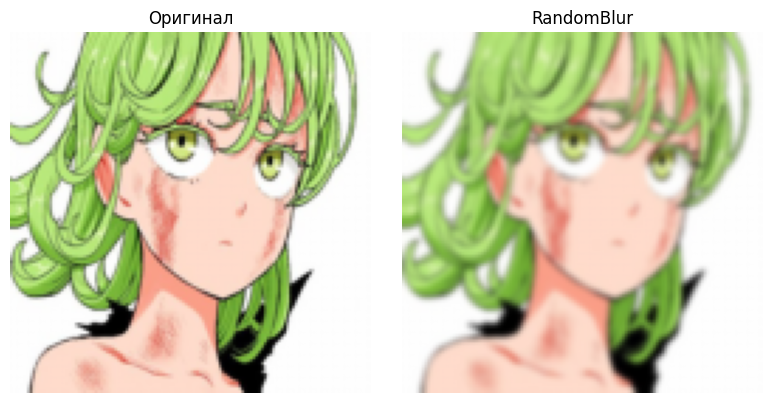

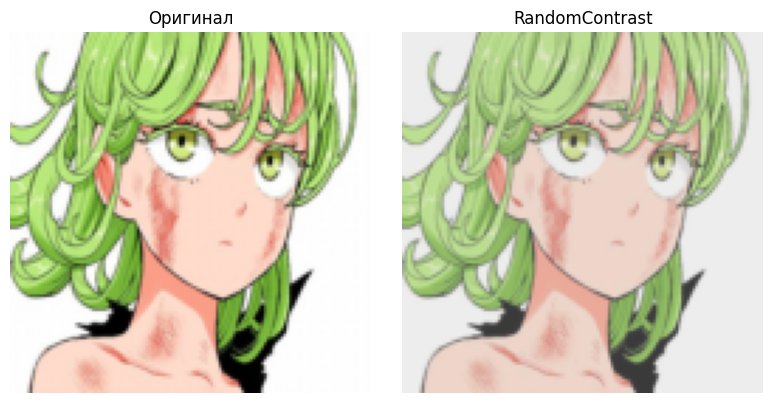

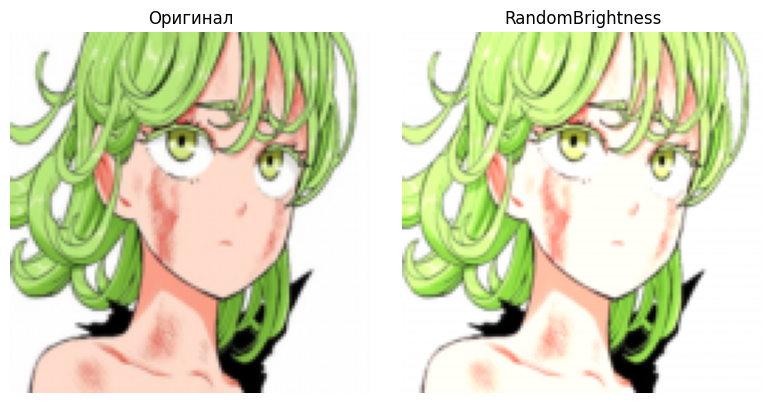

In [12]:
blur_aug = transforms.Compose([
    RandomBlur(p=1.0, radius_range=(0.5, 3.0)),
    transforms.ToTensor()
])
contrast_aug = transforms.Compose([
    transforms.ToTensor(),
    RandomContrast(p=1.0, contrast_range=(0.3, 2.0))
])
bridges_aug = transforms.Compose([
    transforms.ToTensor(),
    RandomBrightness(p=1.0, brightness_range=(0.3, 1.7))
])

for i in range(len(originals)):
    orig_img = get_tensor(originals[i])
    augs_images = [blur_aug(originals[i]), contrast_aug(originals[i]), bridges_aug(originals[i])]
    augs_names = ["RandomBlur", "RandomContrast", "RandomBrightness"]
    for i in range(len(augs_images)):
        show_single_augmentation(orig_img, augs_images[i], augs_names[i])

## 3 - Анализ датасета

30
176740
11186
58867.5


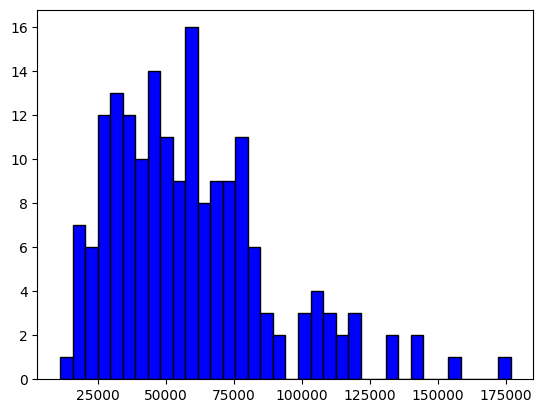

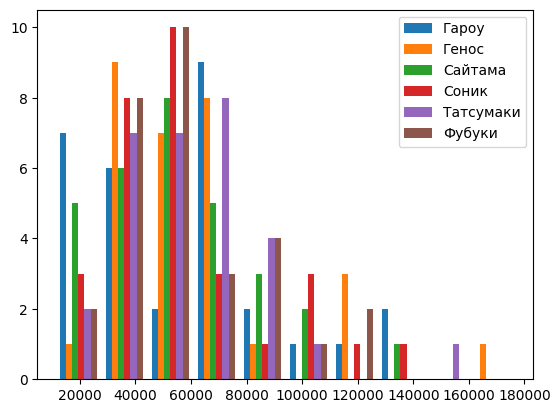

In [13]:
sizes_in_class = [[] for _ in range(len(class_names))]
sizes = []

for i in range(len(dataset)):
    orig_img, label = dataset[i]
    size = os.path.getsize(dataset.get_path(i))
    sizes_in_class[label].append(size)
    sizes.append(size)
print(len(sizes_in_class[1]))
print(max(sizes))
print(min(sizes))
print(np.array(sizes).mean())

plt.hist(sizes, color = 'blue', edgecolor = 'black',
         bins = int(180/5))
plt.show()

plt.hist(sizes_in_class, label=class_names)
plt.legend()
plt.show()

## 4 - Pipeline аугментаций

AugmentationPipeline(
  'random_flip': RandomHorizontalFlip(...),
  'random_crop': RandomCrop(...),
  'random_brightness': RandomBrightness(...)
)


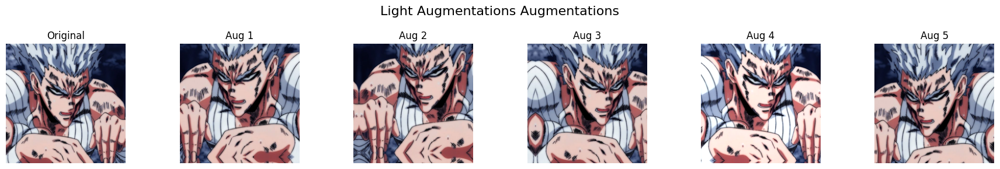

AugmentationPipeline(
  'random_flip': RandomHorizontalFlip(...),
  'random_resized_crop': RandomResizedCrop(...),
  'color_jitter': ColorJitter(...),
  'random_rotation': RandomRotation(...)
)


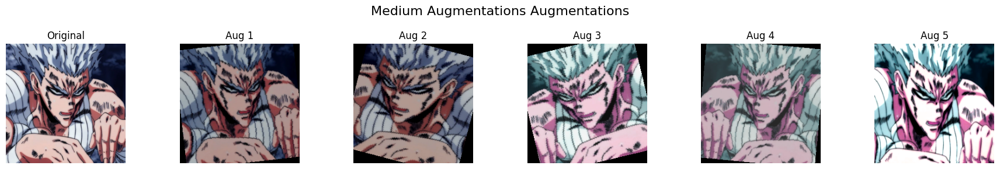

AugmentationPipeline(
  'random_flip': RandomHorizontalFlip(...),
  'random_resized_crop': RandomResizedCrop(...),
  'color_jitter': ColorJitter(...),
  'random_rotation': RandomRotation(...),
  'random_affine': RandomAffine(...),
  'random_contrast': RandomContrast(...)
)


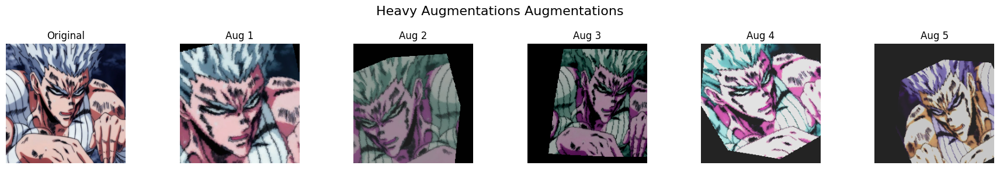

In [14]:
img_sample, layout_sample = dataset[5]

show_pipeline_aug("Light Augmentations", light_pipeline, img_sample)
show_pipeline_aug("Medium Augmentations", medium_pipeline, img_sample)
show_pipeline_aug("Heavy Augmentations", heavy_pipeline, img_sample)

## 5 - Эксперимент с размерами

Статистика для размера 64
1.4193251132965088
0.0703125
Статистика для размера 128
1.5348846912384033
0.0
Статистика для размера 224
1.6223323345184326
0.00390625
Статистика для размера 512
2.0625362396240234
1.00390625


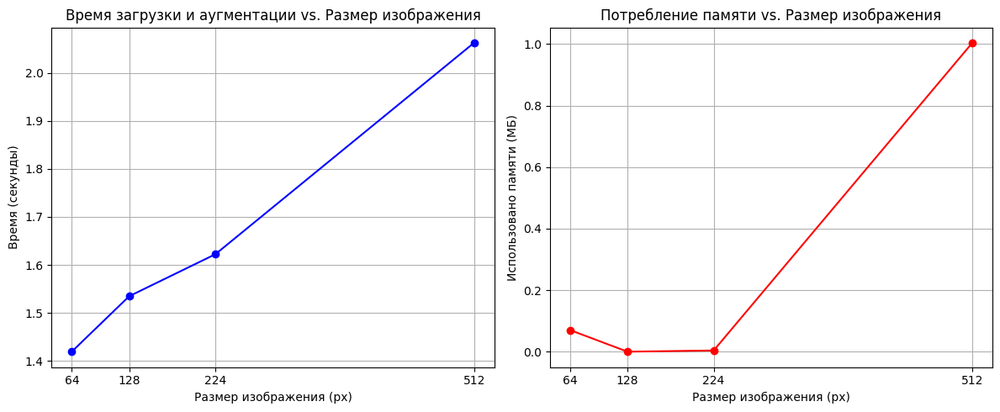

In [15]:
def aug_100_images(pipeline, size):
    start_time = time.time()
    initial_mem = get_current_memory_usage()
    peak_mem = initial_mem
    dataset = CustomImageDataset(root, transform=None, target_size=(size, size))
    for i in range(100):
        orig_img, label = dataset[i]
        display_pipeline_transforms = list(pipeline.get_augmentations().values())
        if not isinstance(display_pipeline_transforms[-1], transforms.ToTensor):
            display_pipeline_transforms.append(transforms.ToTensor())
        temp_compose = transforms.Compose(display_pipeline_transforms)
        augmented_img_tensor = temp_compose(orig_img)
        current_mem = get_current_memory_usage()
        if current_mem > peak_mem:
            peak_mem = current_mem
    end_time = time.time()
    elapsed_time = end_time - start_time
    memory_used = peak_mem - initial_mem
    print("Статистика для размера " + str(size))
    print(str(elapsed_time))
    print(memory_used)
    return elapsed_time, memory_used

def get_current_memory_usage():
    """Возвращает текущее потребление памяти процесса в МБ."""
    process = psutil.Process(os.getpid())
    # memory_info().rss gives resident set size (non-swapped physical memory)
    # memory_info().vms gives virtual memory size
    return process.memory_info().rss / (1024 * 1024) # в МБ

root = 'data/train'
dataset = CustomImageDataset(root, transform=None, target_size=(224, 224))
sizes = [64, 128, 224, 512]
times = [0 for _ in range(len(sizes))]
memories = [0 for _ in range(len(sizes))]

for i in range(len(sizes)):
    times[i], memories[i] = aug_100_images(heavy_pipeline, sizes[i])

show_time(sizes, times)
show_memory(sizes, memories)

## 6 -

100%|██████████| 19/19 [00:09<00:00,  2.11it/s]


Epoch 1/20:
Train Loss: 1.2522, Train Acc: 0.5222
Test Loss: 3.4448, Test Acc: 0.4133
--------------------------------------------------


100%|██████████| 19/19 [00:09<00:00,  1.97it/s]


Epoch 2/20:
Train Loss: 0.5188, Train Acc: 0.8167
Test Loss: 5.7015, Test Acc: 0.4550
--------------------------------------------------


100%|██████████| 19/19 [00:08<00:00,  2.16it/s]


Epoch 3/20:
Train Loss: 0.4364, Train Acc: 0.8389
Test Loss: 1.3342, Test Acc: 0.6833
--------------------------------------------------


100%|██████████| 19/19 [00:08<00:00,  2.18it/s]


Epoch 4/20:
Train Loss: 0.2756, Train Acc: 0.9333
Test Loss: 2.0690, Test Acc: 0.6083
--------------------------------------------------


100%|██████████| 19/19 [00:08<00:00,  2.16it/s]


Epoch 5/20:
Train Loss: 0.1911, Train Acc: 0.9333
Test Loss: 4.6060, Test Acc: 0.4917
--------------------------------------------------


100%|██████████| 19/19 [00:08<00:00,  2.15it/s]


Epoch 6/20:
Train Loss: 0.1912, Train Acc: 0.9389
Test Loss: 2.2767, Test Acc: 0.6100
--------------------------------------------------


100%|██████████| 19/19 [00:09<00:00,  2.09it/s]


Epoch 7/20:
Train Loss: 0.1600, Train Acc: 0.9500
Test Loss: 4.9644, Test Acc: 0.4533
--------------------------------------------------


100%|██████████| 19/19 [00:09<00:00,  2.07it/s]


Epoch 8/20:
Train Loss: 0.1773, Train Acc: 0.9333
Test Loss: 1.1724, Test Acc: 0.7400
--------------------------------------------------


100%|██████████| 19/19 [00:09<00:00,  2.08it/s]


Epoch 9/20:
Train Loss: 0.1127, Train Acc: 0.9722
Test Loss: 0.7164, Test Acc: 0.7900
--------------------------------------------------


100%|██████████| 19/19 [00:08<00:00,  2.11it/s]


Epoch 10/20:
Train Loss: 0.2222, Train Acc: 0.9556
Test Loss: 1.5646, Test Acc: 0.6617
--------------------------------------------------


100%|██████████| 19/19 [00:09<00:00,  1.98it/s]


Epoch 11/20:
Train Loss: 0.2120, Train Acc: 0.9389
Test Loss: 1.5879, Test Acc: 0.6433
--------------------------------------------------


100%|██████████| 19/19 [00:09<00:00,  2.10it/s]


Epoch 12/20:
Train Loss: 0.1854, Train Acc: 0.9333
Test Loss: 0.7279, Test Acc: 0.7883
--------------------------------------------------


100%|██████████| 19/19 [00:09<00:00,  2.07it/s]


Epoch 13/20:
Train Loss: 0.1266, Train Acc: 0.9722
Test Loss: 1.3229, Test Acc: 0.6950
--------------------------------------------------


100%|██████████| 19/19 [00:09<00:00,  2.01it/s]


Epoch 14/20:
Train Loss: 0.1897, Train Acc: 0.9500
Test Loss: 1.1407, Test Acc: 0.7167
--------------------------------------------------


100%|██████████| 19/19 [00:08<00:00,  2.23it/s]


Epoch 15/20:
Train Loss: 0.1197, Train Acc: 0.9611
Test Loss: 0.8220, Test Acc: 0.7750
--------------------------------------------------


100%|██████████| 19/19 [00:08<00:00,  2.24it/s]


Epoch 16/20:
Train Loss: 0.1456, Train Acc: 0.9611
Test Loss: 0.5945, Test Acc: 0.8317
--------------------------------------------------


100%|██████████| 19/19 [00:08<00:00,  2.16it/s]


Epoch 17/20:
Train Loss: 0.1216, Train Acc: 0.9611
Test Loss: 1.0551, Test Acc: 0.7350
--------------------------------------------------


100%|██████████| 19/19 [00:08<00:00,  2.19it/s]


Epoch 18/20:
Train Loss: 0.0496, Train Acc: 0.9889
Test Loss: 0.9037, Test Acc: 0.7650
--------------------------------------------------


100%|██████████| 19/19 [00:08<00:00,  2.16it/s]


Epoch 19/20:
Train Loss: 0.1045, Train Acc: 0.9556
Test Loss: 0.7004, Test Acc: 0.7983
--------------------------------------------------


100%|██████████| 19/19 [00:08<00:00,  2.21it/s]


Epoch 20/20:
Train Loss: 0.1254, Train Acc: 0.9500
Test Loss: 0.6639, Test Acc: 0.8033
--------------------------------------------------


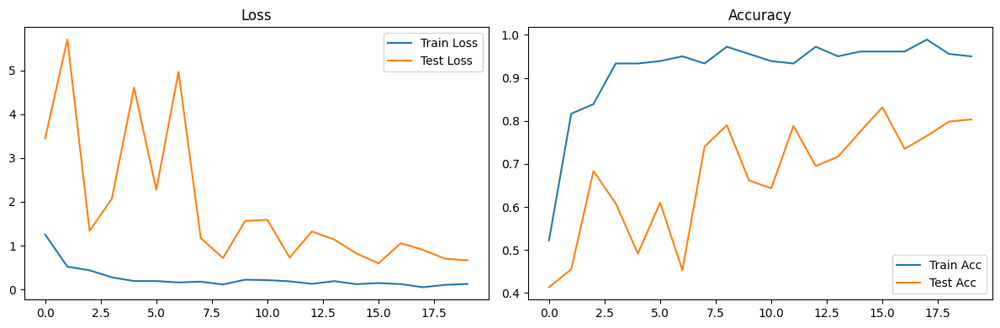

In [19]:
from torchvision import transforms, models
from torch.utils.data import DataLoader

transform = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    RandomBlur(p=0.4, radius_range=(0.5, 1.5)),
    RandomBrightness(p=0.6, brightness_range=(0.7, 1.3)),
    RandomContrast(p=0.8, contrast_range=(0.6, 1.4)), # Наша новая аугментация
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_dataset = CustomImageDataset('data/train', transform=transform)
test_dataset = CustomImageDataset('data/test', transform=transform)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Загрузка предобученной модели
model = models.resnet18(weights='IMAGENET1K_V1')
model.fc = torch.nn.Linear(model.fc.in_features, len(train_dataset.get_class_names()))
model.to(device)
history = train_model(model, train_loader, test_loader, False, epochs=20, device=str(device))
plot_training_history(history)